In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

import torchvision
from torchvision import datasets
from torchvision import transforms
from torchvision.utils import save_image
from torchsummary import summary
from random import randint

from IPython.display import Image
from IPython.core.display import Image, display

from collections import defaultdict
%load_ext autoreload
%autoreload 2

In [2]:

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [7]:
batch_size=4

In [8]:
# Load Data
dataset = datasets.ImageFolder(root='/Users/watsont6/data/britto/normalized/', transform=transforms.Compose([
    transforms.ToTensor()
]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
len(dataset.imgs), len(dataloader)

(128, 32)

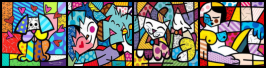

In [9]:
## Fixed input for debugging
fixed_x, _ = next(iter(dataloader))
save_image(fixed_x, 'real_image.png')

Image('real_image.png')


In [10]:
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)
class UnFlatten(nn.Module):
    def forward(self, input, size=1024):
        return input.view(input.size(0), size, 1, 1)

In [12]:
class VAE(nn.Module):
    def __init__(self, image_channels=3, h_dim=1024, z_dim=4):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2),
            nn.ReLU(),
            Flatten()
        )
        
        self.fc1 = nn.Linear(h_dim, z_dim)
        self.fc2 = nn.Linear(h_dim, z_dim)
        self.fc3 = nn.Linear(z_dim, h_dim)
        
        self.decoder = nn.Sequential(
            UnFlatten(),
            nn.ConvTranspose2d(h_dim, 128, kernel_size=5, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=6, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=6, stride=2),
            nn.Sigmoid(),
        )
        
    def reparameterize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        # return torch.normal(mu, std)
        esp = torch.randn(*mu.size())
        z = mu + std * esp
        return z
    
    def bottleneck(self, h):
        mu, logvar = self.fc1(h), self.fc2(h)
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar

    def encode(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        return z, mu, logvar

    def decode(self, z):
        z = self.fc3(z)
        z = self.decoder(z)
        return z

    def forward(self, x):
        z, mu, logvar = self.encode(x)
        z = self.decode(z)
        return z, mu, logvar

In [13]:
image_channels = fixed_x.size(1)
image_channels

3

In [14]:
model = VAE(image_channels=image_channels).to(device)
# model.load_state_dict(torch.load('vae.torch', map_location='cpu'))

In [15]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [16]:
def loss_fn(recon_x, x, mu, logvar):
    BCE = F.binary_cross_entropy(recon_x, x, size_average=False)
    # BCE = F.mse_loss(recon_x, x, size_average=False)

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    return BCE + KLD, BCE, KLD

In [17]:
!rm -rfr reconstructed
!mkdir recons

mkdir: recons: File exists


In [18]:
epochs =10000

In [ ]:
training_output = defaultdict(lambda: [])
for epoch in range(epochs):
    for idx, (images, _) in enumerate(dataloader):
        recon_images, mu, logvar = model(images)
        loss, bce, kld = loss_fn(recon_images, images, mu, logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        to_print = "Epoch[{}/{}] Loss: {:.3f} {:.3f} {:.3f}".format(epoch+1, 
                                epochs, loss.item()/batch_size, bce.item()/batch_size, kld.item()/batch_size)
        training_output['loss'].append(loss.item())
        training_output['bce'].append(bce.item())
        training_output['kld'].append(kld.item())
    
    if epoch % 100 == 0:
        print(to_print)
        torch.save(model.state_dict(), 'britto_model/vae_{}.torch'.format(epoch))

Epoch[1/10000] Loss: 6099.144 6097.675 1.469
Epoch[101/10000] Loss: 6204.586 6203.075 1.512
Epoch[201/10000] Loss: 6235.845 6234.487 1.358
Epoch[301/10000] Loss: 5822.096 5820.621 1.475


In [21]:
def compare(x):
    recon_x, _, _ = model(x)
    return torch.cat([x, recon_x])

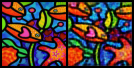

In [26]:
#compare random
original_x = dataset[randint(0, 63)][0].unsqueeze(0)
compare_x = compare(original_x)

save_image(compare_x.data.cpu(), 'sample_image.png')
display(Image('sample_image.png', width=700, unconfined=True))

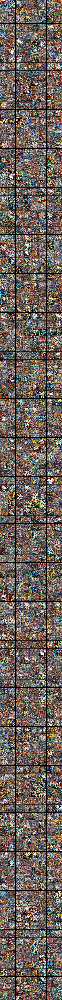

In [28]:
sample = torch.randn(1024,4).to(device)
sample = model.decode(sample).cpu()
save_image(sample, 'new_image.png')
display(Image('new_image.png', width=700, unconfined=True))